In [1]:
!pip install tensorflow
import tensorflow as tf
print(tf.__version__)

2.17.0


In [2]:
!pip install tensorflow_datasets
import tensorflow_datasets as tfds

tfds.__version__

'4.9.6'

In [3]:
import tensorflow_datasets as tfds

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [4]:
print(raw_train)
print(raw_validation)
print(raw_test)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [5]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

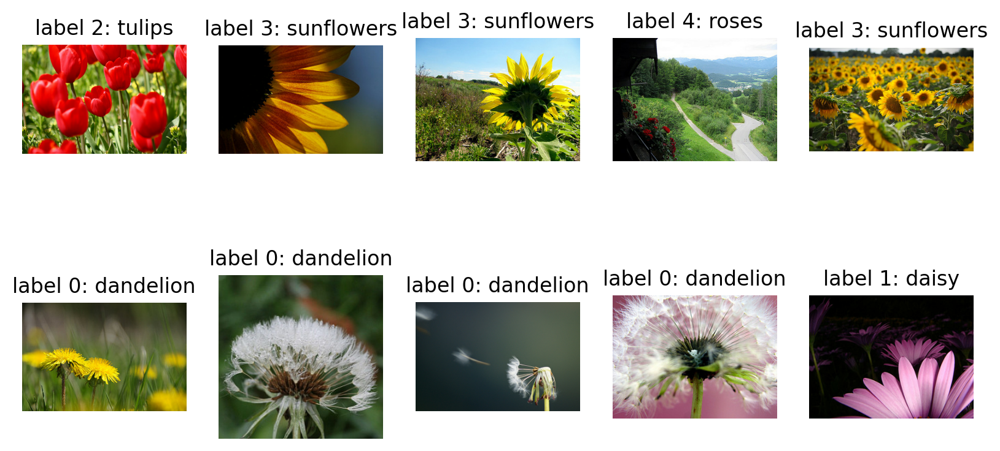

In [6]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [7]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/255.0) # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [8]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


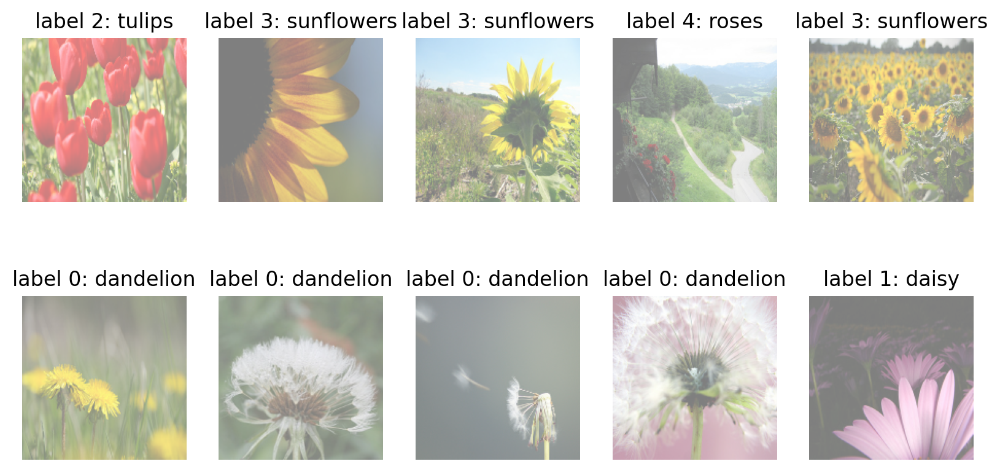

In [9]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [11]:
import tensorflow as tf
import numpy as np
from sklearn.model_selection import KFold

# 전체 데이터셋 준비 (train과 validation을 합침)
full_dataset = train.concatenate(validation)

# 데이터셋을 numpy 배열로 변환
images, labels = [], []
for image, label in full_dataset:
    images.append(image.numpy())
    labels.append(label.numpy())

images = np.array(images)
labels = np.array(labels)

# 5-fold 교차 검증 설정
n_splits = 5
kfold = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# 교차 검증 수행
fold_no = 1
acc_per_fold = []
loss_per_fold = []

for train_index, val_index in kfold.split(images, labels):
    print(f'Fold {fold_no}')

    # 학습 및 검증 데이터 분리
    X_train, X_val = images[train_index], images[val_index]
    y_train, y_val = labels[train_index], labels[val_index]

    # TensorFlow 데이터셋으로 변환
    train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(32).prefetch(tf.data.AUTOTUNE)
    val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(32).prefetch(tf.data.AUTOTUNE)

Fold 1
Fold 1
Fold 1
Fold 1
Fold 1


In [12]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal", input_shape=(160, 160, 3)),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.1),
])

model = Sequential([
    data_augmentation,
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=128, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=256, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dropout(0.5),
    Dense(units=256, activation='relu'),
    Dropout(0.3),
    Dense(units=5, activation='softmax')  # 5개 클래스를 위해 5 유닛으로 변경
])

c:\Users\Biolab\anaconda3a\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\Biolab\anaconda3a\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [13]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 160, 160, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 80, 80, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 80, 80, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 40, 40, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 40, 40, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 20, 20, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 10, 10, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    13,107,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,628,741 (51.99 MB)

 Trainable params: 13,628,741 (51.99 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [15]:
image.flatten()

array([1, 2, 3, 4])

In [16]:
learning_rate = 0.00005
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [17]:
BATCH_SIZE = 64
SHUFFLE_BUFFER_SIZE = 1000

In [18]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE).repeat()
validation_batches = validation.batch(BATCH_SIZE).repeat()
test_batches = test.batch(BATCH_SIZE)

In [19]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([64, 160, 160, 3]), TensorShape([64]))

In [20]:
import tensorflow as tf

# 만약 `raw_validation`이 tf.data.Dataset 객체라면
num_validation_samples = sum(1 for _ in raw_validation)

In [21]:
validation_steps = 10
num_validation_samples = 2000
validation_steps = num_validation_samples // BATCH_SIZE
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - accuracy: 0.1556 - loss: 1.6077
initial loss: 1.61
initial accuracy: 0.16


In [22]:
EPOCHS = 10
steps_per_epoch = len(train) // BATCH_SIZE
history = model.fit(
    train_batches,
    epochs=EPOCHS,
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_batches,
    validation_steps=len(validation) // BATCH_SIZE
)

Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 31s 664ms/step - accuracy: 0.2234 - loss: 1.6020 - val_accuracy: 0.3844 - val_loss: 1.5453
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 30s 660ms/step - accuracy: 0.3516 - loss: 1.5205 - val_accuracy: 0.3498 - val_loss: 1.3749
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 32s 704ms/step - accuracy: 0.3963 - loss: 1.3874 - val_accuracy: 0.5149 - val_loss: 1.2571
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 29s 640ms/step - accuracy: 0.4041 - loss: 1.3131 - val_accuracy: 0.5479 - val_loss: 1.1518
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 30s 671ms/step - accuracy: 0.4328 - loss: 1.2698 - val_accuracy: 0.5479 - val_loss: 1.1497
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 33s 738ms/step - accuracy: 0.4607 - loss: 1.2247 - val_accuracy: 0.5512 - val_loss: 1.1443
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 30s 673ms/step - accuracy: 0.4695 - loss: 1.2020 - val_accuracy: 0.5312 - val_loss: 1.1398
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 29s 650ms/step - accuracy: 0.4972 - loss: 1.1819 - val_accu

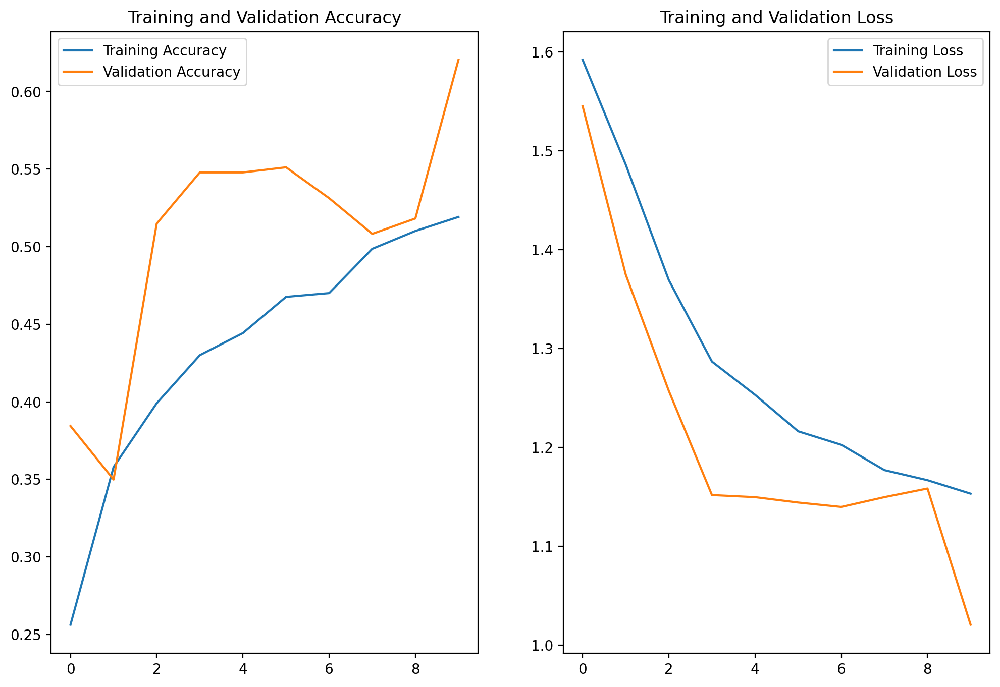

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [24]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


array([[0.01819206, 0.059693  , 0.6071743 , 0.12583803, 0.18910266],
       [0.60563254, 0.33285326, 0.02148679, 0.00503259, 0.03499477],
       [0.46847704, 0.05842975, 0.05935575, 0.3963176 , 0.01741983],
       [0.04002143, 0.14080155, 0.43063882, 0.02785988, 0.36067832],
       [0.29318327, 0.26378307, 0.14573061, 0.1640579 , 0.13324519],
       [0.07407843, 0.29438424, 0.31856152, 0.20870438, 0.10427146],
       [0.02498548, 0.10243988, 0.6377684 , 0.05457352, 0.1802327 ],
       [0.1418894 , 0.1721126 , 0.29646084, 0.21916677, 0.17037043],
       [0.25649208, 0.02555208, 0.06437597, 0.6421151 , 0.01146472],
       [0.70861894, 0.2451744 , 0.01610038, 0.00801904, 0.02208732],
       [0.36871845, 0.41969362, 0.09547515, 0.04736702, 0.0687457 ],
       [0.15855326, 0.03398822, 0.11810362, 0.65831834, 0.03103659],
       [0.04353772, 0.09429659, 0.44168025, 0.27578557, 0.14469981],
       [0.04058794, 0.10384843, 0.47740075, 0.05886482, 0.31929812],
       [0.69782454, 0.19341224, 0.

In [25]:
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 2, 2, 2, 3, 0, 1, 3, 2, 2, 0, 3, 2, 3, 0, 2, 2, 0,
       1, 0, 1, 3, 1, 2, 2, 3, 0, 0, 2, 2, 2, 1, 2, 0, 0, 0, 0, 3, 3, 0,
       0, 1, 0, 1, 2, 2, 3, 1, 2, 1, 1, 2, 0, 1, 1, 2, 4, 3, 3, 1],
      dtype=int64)

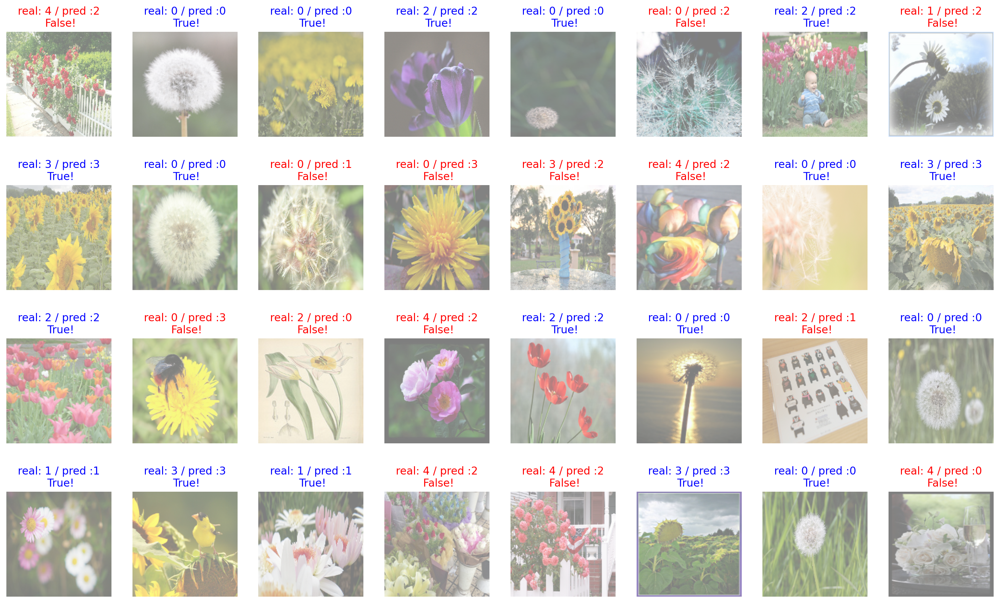

In [26]:
plt.figure(figsize=(20, 12))
for idx, (image, label, prediction) in enumerate(list(zip(images, labels, predictions))[:32]):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [27]:
count = 0
total = len(images)  # 실제 이미지 수 사용

for image, label, prediction in zip(images, labels, predictions):
    if label == prediction:
        count += 1

accuracy = (count / total) * 100
print(f"정확도: {accuracy:.2f}%")

정확도: 54.69%


In [28]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [29]:
image_batch.shape

TensorShape([64, 160, 160, 3])

In [30]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([64, 5, 5, 512])

In [31]:
base_model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 160, 160, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 160, 160, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 80, 80, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 80, 80, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 80, 80, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 40, 40, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 40, 40, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 40, 40, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 40, 40, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 20, 20, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 20, 20, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 20, 20, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 20, 20, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 10, 10, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 10, 10, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 10, 10, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 10, 10, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 5, 5, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [32]:
feature_batch.shape

TensorShape([64, 5, 5, 512])

In [33]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


In [34]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [35]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(64, 512)


In [36]:
from tensorflow.keras.layers import Dense

# dense layer에는 unit과 activation 2개의 매개변수만 사용
# unit의 값은 global_average_layer를 통과했을 때의 값을 고려
# 활성화 함수는 ReLU를 사용
dense_layer = Dense(units=2048, activation='relu')

# unit은 우리가 분류하고 싶은 class를 고려
# 활성화 함수는 Softmax를 사용
prediction_layer = Dense(units=5, activation='softmax')

# feature_batch_average가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 됨
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(64, 5)


In [37]:
base_model.trainable = False

In [38]:
model = tf.keras.Sequential([
    data_augmentation,
    tf.keras.applications.MobileNetV2(include_top=False, weights='imagenet', input_shape=(160, 160, 3)),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(5, activation='softmax')
])

In [39]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_160            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1024)           │     1,311,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,097,093 (15.63 MB)

 Trainable params: 4,062,981 (15.50 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [40]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [41]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 ━━━━━━━━━━━━━━━━━━━━ 7s 229ms/step - accuracy: 0.2301 - loss: 1.7307
initial loss: 1.73
initial accuracy: 0.23


In [42]:
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE

# 데이터셋 최적화 함수
def optimize_dataset(ds):
    return ds.map(lambda x, y: (tf.cast(x, tf.float32) / 255.0, y), num_parallel_calls=AUTOTUNE)\
             .cache()\
             .shuffle(1000)\
             .batch(BATCH_SIZE)\
             .prefetch(AUTOTUNE)

# 데이터셋 준비
train_ds = optimize_dataset(train)
validation_ds = optimize_dataset(validation)

# 스텝 수 계산
steps_per_epoch = len(train_ds)
validation_steps = len(validation_ds)

EPOCHS = 5

# 조기 종료 콜백 추가
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', patience=2, restore_best_weights=True
)

# 모델 컴파일
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# 모델 훈련
history = model.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=validation_ds,
    callbacks=[early_stopping],
    verbose=1
)

# 훈련 결과 출력
print("Training completed.")
print(f"Final training accuracy: {history.history['accuracy'][-1]:.4f}")
print(f"Final validation accuracy: {history.history['val_accuracy'][-1]:.4f}")

Epoch 1/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 97s 810ms/step - accuracy: 0.5851 - loss: 1.1126 - val_accuracy: 0.2425 - val_loss: 10.3336
Epoch 2/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 83s 906ms/step - accuracy: 0.7961 - loss: 0.5929 - val_accuracy: 0.2425 - val_loss: 17.5815
Epoch 3/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 81s 882ms/step - accuracy: 0.8049 - loss: 0.5747 - val_accuracy: 0.2425 - val_loss: 23.3629
Training completed.
Final training accuracy: 0.8110
Final validation accuracy: 0.2425


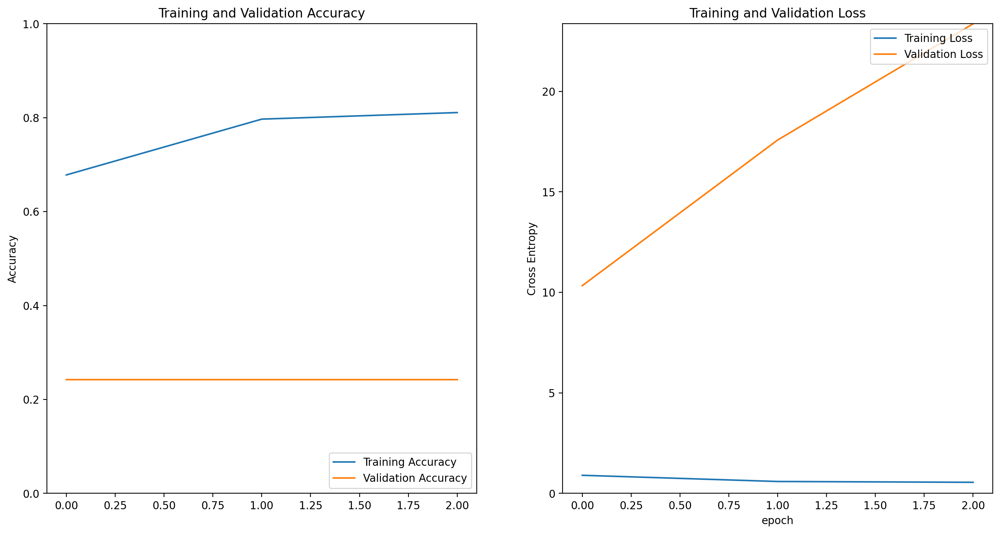

In [43]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))

# 정확도 그래프
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.title('Training and Validation Accuracy')

# 손실 그래프
plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, max(max(loss), max(val_loss))])  # 손실 값 범위에 맞게 y축 설정
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [44]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 182ms/step


array([[1.15694548e-03, 1.69479267e-06, 9.04809773e-01, 5.26522257e-08,
        9.40315425e-02],
       [1.00000000e+00, 8.76157667e-15, 3.84641520e-11, 7.84115328e-10,
        8.08903639e-11],
       [1.00000000e+00, 6.73651550e-16, 1.93515668e-12, 1.59501001e-09,
        4.18855976e-13],
       [9.98816967e-01, 6.90976276e-10, 5.28494747e-05, 6.20853990e-09,
        1.13018171e-03],
       [9.99999404e-01, 1.89548355e-12, 5.58442139e-07, 6.20528573e-10,
        2.71751226e-08],
       [1.00000000e+00, 2.96442837e-17, 4.56672634e-12, 9.01789320e-12,
        1.44986172e-14],
       [5.00271440e-01, 3.48880008e-06, 4.89024162e-01, 1.01867329e-07,
        1.07008023e-02],
       [1.00000000e+00, 3.13403885e-15, 2.26457647e-13, 2.28260987e-11,
        3.22882929e-14],
       [8.83486867e-03, 4.63638307e-15, 1.40887770e-11, 9.91165102e-01,
        7.31297076e-15],
       [1.00000000e+00, 2.99760195e-15, 8.56305218e-12, 4.51941928e-10,
        7.17922249e-12],
       [1.00000000e+00, 4.9869

In [45]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 4, 0,
       0, 0, 0, 3, 0, 4, 4, 0, 0, 0, 4, 4, 2, 0, 0, 0, 0, 3, 0, 0, 3, 4,
       0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 4, 0, 0, 0],
      dtype=int64)

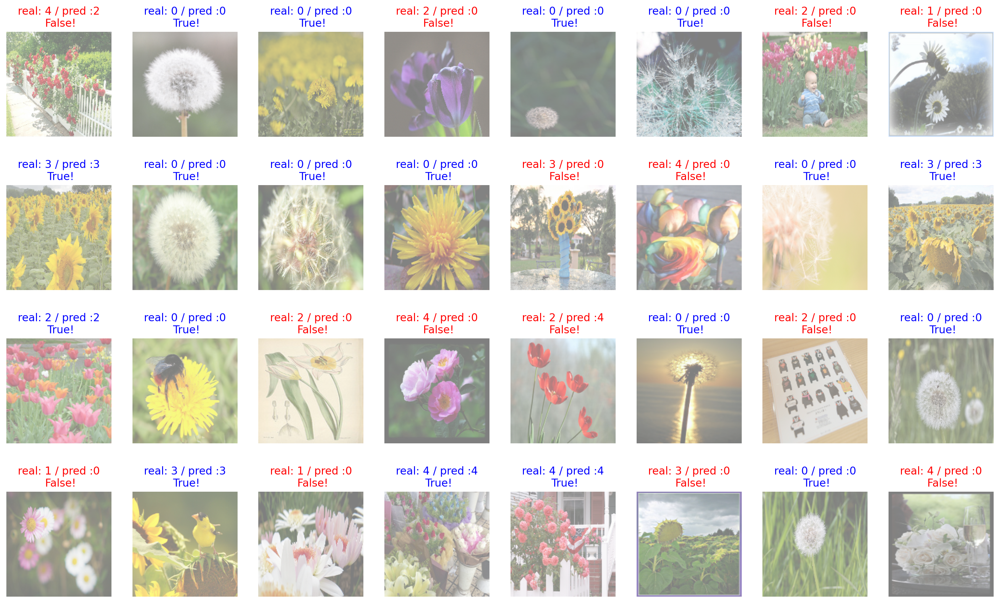

In [46]:
plt.figure(figsize=(20, 12))

max_images = 32
for idx, (image, label, prediction) in enumerate(zip(images[:max_images], labels[:max_images], predictions[:max_images])):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [47]:
count = 0
total = len(images)  # 실제 이미지 수 사용

for image, label, prediction in zip(images, labels, predictions):
    if label == prediction:
        count += 1

accuracy = (count / total) * 100
print(f"정확도: {accuracy:.2f}%")

정확도: 48.44%
